# 蜜蜂识别 - 基于数字图像处理的数据增强与深度学习优化

本实验通过传统数字图像处理技术对训练数据进行预处理和增强，以提升YOLOv8深度学习模型的检测性能

## 1. 环境准备和依赖安装

In [3]:
%pip install ultralytics
%pip install opencv-python
%pip install matplotlib
%pip install seaborn
%pip install scikit-image
%pip install scipy
%pip install numpy
%pip install pillow
%pip install albumentations

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [9]:
import os
import json
import yaml
from pathlib import Path
import shutil
import cv2
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import scipy.ndimage as ndi
from skimage import filters, morphology, measure, feature, segmentation, exposure
from skimage.filters import gaussian, unsharp_mask
from skimage.morphology import opening, closing, erosion, dilation, disk
from skimage.restoration import denoise_nl_means, denoise_bilateral
from scipy import ndimage
from ultralytics import YOLO
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random

# 设置matplotlib中文字体
plt.rcParams['font.sans-serif'] = ['SimHei', 'Arial Unicode MS']
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.figsize'] = (12, 8)

print("环境准备完成！")

环境准备完成！


## 2. 数据集结构分析与转换

In [10]:
class BeeDatasetProcessor:
    def __init__(self, dataset_path="bee-detection"):
        self.dataset_path = Path(dataset_path)
        # 初始转换后的YOLO数据集路径（作为增强流程的输入）
        self.yolo_dataset_path = Path("bee_yolo_dataset")
        # 最终用于训练的增强数据集路径
        self.enhanced_dataset_path = Path("bee_enhanced_dataset")
        self.class_names = {}
        
    def analyze_and_convert_dataset(self):
        """分析数据集并转换为YOLO格式"""
        print("=== 数据集分析与转换 ===")
        
        # 创建输出目录
        for split in ['train', 'valid', 'test']:
            (self.yolo_dataset_path / split / 'images').mkdir(parents=True, exist_ok=True)
            (self.yolo_dataset_path / split / 'labels').mkdir(parents=True, exist_ok=True)
            (self.enhanced_dataset_path / split / 'images').mkdir(parents=True, exist_ok=True)
            (self.enhanced_dataset_path / split / 'labels').mkdir(parents=True, exist_ok=True)
        
        dataset_stats = {}
        
        # 转换每个数据集分割
        for split in ['train', 'valid', 'test']:
            stats = self._convert_split(split)
            dataset_stats[split] = stats
            
        # 创建YAML配置文件
        self._create_yaml_configs()
        
        # 打印统计信息
        self._print_dataset_stats(dataset_stats)
        
        return dataset_stats
    
    def _convert_split(self, split):
        """转换单个数据集分割"""
        coco_file = self.dataset_path / split / "_annotations.coco.json"
        images_dir = self.dataset_path / split / "images"
        
        if not coco_file.exists():
            print(f"警告: {coco_file} 不存在，跳过 {split} 集")
            return {'images': 0, 'annotations': 0}
            
        with open(coco_file, 'r') as f:
            coco_data = json.load(f)
        
        # 存储类别信息
        for cat in coco_data.get('categories', []):
            self.class_names[cat['id']] = cat['name']
        
        # 构建图片ID到文件名的映射
        images_info = {img['id']: img for img in coco_data.get('images', [])}
        
        # 按图片分组标注
        image_annotations = defaultdict(list)
        for ann in coco_data.get('annotations', []):
            image_annotations[ann['image_id']].append(ann)
        
        converted_count = 0
        total_annotations = 0
        
        for image_id, image_info in images_info.items():
            src_img_path = images_dir / image_info['file_name']
            dst_img_path = self.yolo_dataset_path / split / 'images' / image_info['file_name']
            
            if src_img_path.exists():
                # 复制原始图片
                shutil.copy2(src_img_path, dst_img_path)
                
                # 转换标注
                img_width = image_info['width']
                img_height = image_info['height']
                
                # 创建YOLO格式标注文件
                label_file = self.yolo_dataset_path / split / 'labels' / (Path(image_info['file_name']).stem + '.txt')
                
                with open(label_file, 'w') as f:
                    for ann in image_annotations.get(image_id, []):
                        bbox = ann['bbox']
                        x, y, w, h = bbox
                        
                        # 转换为中心点坐标并归一化
                        x_center = (x + w / 2) / img_width
                        y_center = (y + h / 2) / img_height
                        width_norm = w / img_width
                        height_norm = h / img_height
                        
                        # COCO类别ID通常从1开始，YOLO从0开始
                        class_id = ann['category_id'] - 1
                        
                        f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width_norm:.6f} {height_norm:.6f}\n")
                        total_annotations += 1
                
                converted_count += 1
        
        print(f"{split} 集转换完成: {converted_count} 张图片, {total_annotations} 个标注")
        return {'images': converted_count, 'annotations': total_annotations}
    
    def _create_yaml_configs(self):
        """创建YAML配置文件"""
        class_names_list = []
        if self.class_names:
            max_id = max(self.class_names.keys())
            for i in range(1, max_id + 1):
                if i in self.class_names:
                    class_names_list.append(self.class_names[i])
        
        if not class_names_list:
            class_names_list = ['bee']
        
        # 增强数据集配置
        config = {
            'path': str(self.enhanced_dataset_path.absolute()),
            'train': 'train/images',
            'val': 'valid/images',
            'test': 'test/images',
            'nc': len(class_names_list),
            'names': class_names_list
        }
        with open(self.enhanced_dataset_path / 'dataset.yaml', 'w', encoding='utf-8') as f:
            yaml.dump(config, f, default_flow_style=False, allow_unicode=True)
            
        print("为增强数据集创建 'dataset.yaml' 配置文件。")
        print(f"类别数量: {len(class_names_list)}, 类别: {class_names_list}")
    
    def _print_dataset_stats(self, stats):
        """打印数据集统计信息"""
        print("\n=== 原始数据集统计信息 ===")
        total_images = sum(s['images'] for s in stats.values())
        total_annotations = sum(s['annotations'] for s in stats.values())
        
        for split, stat in stats.items():
            if stat['images'] > 0:
                avg_ann = stat['annotations'] / stat['images']
                print(f"{split:>6}: {stat['images']:>4} 张图片, {stat['annotations']:>5} 个标注, 平均 {avg_ann:.1f} 个/图")
        
        print(f"{'总计':>6}: {total_images:>4} 张图片, {total_annotations:>5} 个标注")

In [11]:
# 初始化数据处理器
processor = BeeDatasetProcessor(dataset_path="bee-detection")
dataset_stats = processor.analyze_and_convert_dataset()

=== 数据集分析与转换 ===
train 集转换完成: 6721 张图片, 9370 个标注
valid 集转换完成: 1914 张图片, 2661 个标注
test 集转换完成: 996 张图片, 1343 个标注
为增强数据集创建 'dataset.yaml' 配置文件。
类别数量: 1, 类别: ['bees']

=== 原始数据集统计信息 ===
 train: 6721 张图片,  9370 个标注, 平均 1.4 个/图
 valid: 1914 张图片,  2661 个标注, 平均 1.4 个/图
  test:  996 张图片,  1343 个标注, 平均 1.3 个/图
    总计: 9631 张图片, 13374 个标注


## 3. 图像质量分析与问题识别

In [12]:
class ImageQualityAnalyzer:
    """图像质量分析器"""
    
    def __init__(self, dataset_processor):
        self.processor = dataset_processor
        
    def analyze_image_quality_issues(self, split='train', num_samples=20):
        """分析图像质量问题"""
        images_dir = self.processor.yolo_dataset_path / split / 'images'
        image_files = list(images_dir.glob('*.jpg')) + list(images_dir.glob('*.png'))
        
        if not image_files:
            print(f"未找到图像文件")
            return
        
        # 随机选择样本
        np.random.seed(42)
        selected_files = np.random.choice(image_files, min(num_samples, len(image_files)), replace=False)
        
        quality_issues = {
            'low_contrast': [],
            'blurred': [],
            'dark': [],
            'bright': [],
            'noisy': []
        }
        
        quality_metrics = []
        
        print("分析图像质量问题...")
        
        for img_path in selected_files:
            img = cv2.imread(str(img_path))
            img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
            # 计算质量指标
            metrics = self._calculate_quality_metrics(img, img_gray)
            metrics['filename'] = img_path.name
            quality_metrics.append(metrics)
            
            # 识别问题类型
            if metrics['contrast'] < 30:
                quality_issues['low_contrast'].append(img_path)
            if metrics['blur_score'] < 100:
                quality_issues['blurred'].append(img_path)
            if metrics['brightness'] < 80:
                quality_issues['dark'].append(img_path)
            if metrics['brightness'] > 180:
                quality_issues['bright'].append(img_path)
            if metrics['noise_level'] > 0.15:
                quality_issues['noisy'].append(img_path)
        
        # 可视化问题样本
        self._visualize_quality_issues(quality_issues)
        
        # 统计分析
        self._print_quality_statistics(quality_metrics, quality_issues)
        
        return quality_metrics, quality_issues
    
    def _calculate_quality_metrics(self, img, img_gray):
        """计算图像质量指标"""
        # 亮度
        brightness = np.mean(img_gray)
        
        # 对比度
        contrast = np.std(img_gray)
        
        # 模糊度检测（拉普拉斯算子方差）
        blur_score = cv2.Laplacian(img_gray, cv2.CV_64F).var()
        
        # 噪声估计（基于梯度）
        grad_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
        noise_level = np.std(gradient_magnitude) / np.mean(gradient_magnitude)
        
        # 色彩饱和度
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        saturation = np.mean(hsv[:,:,1])
        
        return {
            'brightness': brightness,
            'contrast': contrast,
            'blur_score': blur_score,
            'noise_level': noise_level,
            'saturation': saturation
        }
    
    def _visualize_quality_issues(self, quality_issues):
        """可视化质量问题样本"""
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        
        issue_types = ['low_contrast', 'blurred', 'dark', 'bright', 'noisy']
        titles = ['低对比度', '模糊', '过暗', '过亮', '噪声']
        
        for i, (issue_type, title) in enumerate(zip(issue_types, titles)):
            if quality_issues[issue_type]:
                # 显示问题样本
                img_path = quality_issues[issue_type][0]
                img = cv2.imread(str(img_path))
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                axes[0, i].imshow(img_rgb)
                axes[0, i].set_title(f'{title}问题示例')
                axes[0, i].axis('off')
                
                # 显示增强后的效果（预览）
                enhanced_img = self._preview_enhancement(img, issue_type)
                axes[1, i].imshow(enhanced_img)
                axes[1, i].set_title(f'{title}增强预览')
                axes[1, i].axis('off')
            else:
                axes[0, i].text(0.5, 0.5, f'无{title}问题', ha='center', va='center')
                axes[0, i].axis('off')
                axes[1, i].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    def _preview_enhancement(self, img, issue_type):
        """预览增强效果"""
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        if issue_type == 'low_contrast':
            # 直方图均衡化
            img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
            img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
            return cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
        
        elif issue_type == 'blurred':
            # 锐化
            kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
            return cv2.filter2D(img_rgb, -1, kernel)
        
        elif issue_type == 'dark':
            # 伽马校正
            gamma = 1.5
            return np.power(img_rgb / 255.0, 1/gamma) * 255
        
        elif issue_type == 'bright':
            # 降低亮度
            return np.clip(img_rgb * 0.8, 0, 255).astype(np.uint8)
        
        elif issue_type == 'noisy':
            # 双边滤波去噪
            return cv2.bilateralFilter(img_rgb, 9, 75, 75)
        
        return img_rgb
    
    def _print_quality_statistics(self, quality_metrics, quality_issues):
        """打印质量统计信息"""
        import pandas as pd
        
        df = pd.DataFrame(quality_metrics)
        
        print("\n=== 图像质量统计 ===")
        print(f"亮度: {df['brightness'].mean():.1f} ± {df['brightness'].std():.1f}")
        print(f"对比度: {df['contrast'].mean():.1f} ± {df['contrast'].std():.1f}")
        print(f"清晰度: {df['blur_score'].mean():.1f} ± {df['blur_score'].std():.1f}")
        print(f"噪声水平: {df['noise_level'].mean():.3f} ± {df['noise_level'].std():.3f}")
        
        print("\n=== 质量问题统计 ===")
        total_samples = len(quality_metrics)
        for issue, samples in quality_issues.items():
            ratio = len(samples) / total_samples * 100
            print(f"{issue:>15}: {len(samples):>3} 张 ({ratio:>5.1f}%)")

分析图像质量问题...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


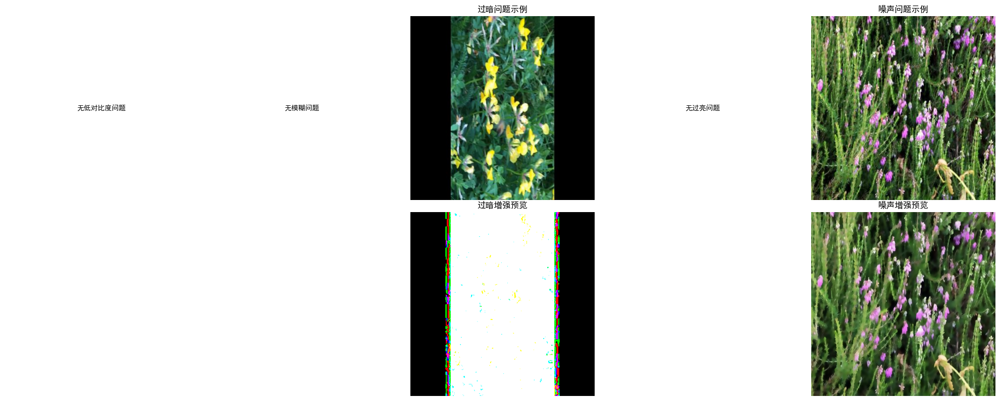


=== 图像质量统计 ===
亮度: 90.8 ± 20.2
对比度: 56.4 ± 7.9
清晰度: 2274.3 ± 1844.7
噪声水平: 1.024 ± 0.268

=== 质量问题统计 ===
   low_contrast:   0 张 (  0.0%)
        blurred:   0 张 (  0.0%)
           dark:   5 张 ( 16.7%)
         bright:   0 张 (  0.0%)
          noisy:  30 张 (100.0%)


In [13]:
# 分析图像质量
quality_analyzer = ImageQualityAnalyzer(processor)
quality_metrics, quality_issues = quality_analyzer.analyze_image_quality_issues('train', 30)

## 4. 数字图像处理增强策略

In [14]:
class ImageEnhancer:
    """图像增强器"""
    
    def __init__(self):
        self.enhancement_methods = {}
    
    def enhance_contrast(self, img):
        """对比度增强"""
        methods = {}
        
        # 1. 直方图均衡化
        img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
        img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
        methods['histogram_eq'] = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
        
        # 2. 自适应直方图均衡化 (CLAHE)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
        img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])
        methods['clahe'] = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
        
        # 3. 伽马校正
        gamma = 1.2
        methods['gamma_correction'] = np.power(img / 255.0, 1/gamma) * 255
        methods['gamma_correction'] = np.clip(methods['gamma_correction'], 0, 255).astype(np.uint8)
        
        # 4. 线性拉伸
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        min_val, max_val = np.percentile(img_gray, [2, 98])
        stretched = np.clip((img.astype(np.float32) - min_val) / (max_val - min_val) * 255, 0, 255)
        methods['linear_stretch'] = stretched.astype(np.uint8)
        
        return methods
    
    def enhance_sharpness(self, img):
        """锐化增强"""
        methods = {}
        
        # 1. 拉普拉斯锐化
        kernel_laplacian = np.array([[0,-1,0], [-1,5,-1], [0,-1,0]])
        methods['laplacian'] = cv2.filter2D(img, -1, kernel_laplacian)
        
        # 2. 高斯-拉普拉斯锐化
        kernel_sharpen = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
        methods['gaussian_laplacian'] = cv2.filter2D(img, -1, kernel_sharpen)
        
        # 3. Unsharp Mask锐化
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        gaussian_blurred = cv2.GaussianBlur(img_gray, (0, 0), 1.0)
        unsharp_mask = cv2.addWeighted(img_gray, 1.5, gaussian_blurred, -0.5, 0)
        methods['unsharp_mask'] = cv2.merge([unsharp_mask, unsharp_mask, unsharp_mask])
        
        # 4. 高频增强
        img_float = img.astype(np.float32) / 255.0
        blur = cv2.GaussianBlur(img_float, (0, 0), 1.0)
        high_freq = img_float - blur
        enhanced = img_float + 0.5 * high_freq
        methods['high_freq_boost'] = np.clip(enhanced * 255, 0, 255).astype(np.uint8)
        
        return methods
    
    def denoise_image(self, img):
        """图像去噪"""
        methods = {}
        
        # 1. 双边滤波
        methods['bilateral'] = cv2.bilateralFilter(img, 9, 75, 75)
        
        # 2. 高斯滤波
        methods['gaussian'] = cv2.GaussianBlur(img, (5, 5), 0)
        
        # 3. 非局部均值去噪
        methods['nlm'] = cv2.fastNlMeansDenoising(img, None, 10, 7, 21)
        
        # 4. 中值滤波
        methods['median'] = cv2.medianBlur(img, 5)
        
        # 5. 形态学去噪
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
        methods['morphology'] = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
        
        return methods
    
    def adjust_lighting(self, img):
        """光照调整"""
        methods = {}
        
        # 1. 亮度调整
        methods['brighter'] = cv2.convertScaleAbs(img, alpha=1.2, beta=20)
        methods['darker'] = cv2.convertScaleAbs(img, alpha=0.8, beta=-20)
        
        # 2. 对数变换
        img_log = np.log1p(img.astype(np.float32))
        img_log = (img_log / img_log.max() * 255).astype(np.uint8)
        methods['log_transform'] = img_log
        
        # 3. 指数变换
        img_exp = np.power(img.astype(np.float32) / 255.0, 0.5) * 255
        methods['exp_transform'] = img_exp.astype(np.uint8)
        
        return methods
    
    def color_enhancement(self, img):
        """颜色增强"""
        methods = {}
        
        # 1. HSV调整
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        hsv[:,:,1] = cv2.multiply(hsv[:,:,1], 1.3)  # 增加饱和度
        methods['saturation_boost'] = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
        
        # 2. Lab颜色空间增强
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        lab[:,:,0] = cv2.equalizeHist(lab[:,:,0])  # 亮度均衡
        methods['lab_enhancement'] = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
        
        # 3. 白平衡
        result = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        avg_a = np.average(result[:, :, 1])
        avg_b = np.average(result[:, :, 2])
        result[:, :, 1] = result[:, :, 1] - ((avg_a - 128) * (result[:, :, 0] / 255.0) * 1.1)
        result[:, :, 2] = result[:, :, 2] - ((avg_b - 128) * (result[:, :, 0] / 255.0) * 1.1)
        methods['white_balance'] = cv2.cvtColor(result, cv2.COLOR_LAB2BGR)
        
        return methods
    
    def demonstrate_enhancements(self, img_path):
        """演示所有增强方法"""
        img = cv2.imread(str(img_path))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        print(f"演示图像增强方法: {img_path.name}")
        
        # 对比度增强
        contrast_methods = self.enhance_contrast(img)
        self._visualize_methods(img_rgb, contrast_methods, "对比度增强方法")
        
        # 锐化增强
        sharpness_methods = self.enhance_sharpness(img)
        sharpness_methods = {k: cv2.cvtColor(v, cv2.COLOR_BGR2RGB) if len(v.shape)==3 else cv2.merge([v,v,v]) for k, v in sharpness_methods.items()}
        self._visualize_methods(img_rgb, sharpness_methods, "锐化增强方法")
        
        # 去噪方法
        denoise_methods = self.denoise_image(img)
        denoise_methods = {k: cv2.cvtColor(v, cv2.COLOR_BGR2RGB) for k, v in denoise_methods.items()}
        self._visualize_methods(img_rgb, denoise_methods, "去噪方法")
        
        # 光照调整
        lighting_methods = self.adjust_lighting(img)
        lighting_methods = {k: cv2.cvtColor(v, cv2.COLOR_BGR2RGB) for k, v in lighting_methods.items()}
        self._visualize_methods(img_rgb, lighting_methods, "光照调整方法")
        
        # 颜色增强
        color_methods = self.color_enhancement(img)
        color_methods = {k: cv2.cvtColor(v, cv2.COLOR_BGR2RGB) for k, v in color_methods.items()}
        self._visualize_methods(img_rgb, color_methods, "颜色增强方法")
    
    def _visualize_methods(self, original, methods, title):
        """可视化增强方法"""
        n_methods = len(methods)
        cols = min(5, n_methods + 1)
        rows = (n_methods + 1 + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(cols*3, rows*3))
        if rows == 1:
            axes = axes.reshape(1, -1)
        
        # 显示原图
        axes[0, 0].imshow(original)
        axes[0, 0].set_title('原图')
        axes[0, 0].axis('off')
        
        # 显示增强结果
        for i, (method_name, enhanced_img) in enumerate(methods.items(), 1):
            row = i // cols
            col = i % cols
            axes[row, col].imshow(enhanced_img)
            axes[row, col].set_title(method_name)
            axes[row, col].axis('off')
        
        # 隐藏多余的子图
        for i in range(len(methods) + 1, rows * cols):
            row = i // cols
            col = i % cols
            axes[row, col].axis('off')
        
        plt.suptitle(title, fontsize=16)
        plt.tight_layout()
        plt.show()

演示图像增强方法: all-movs_mp4-780_jpg.rf.40192dca0862e76209fef5ca0ab7fbde.jpg


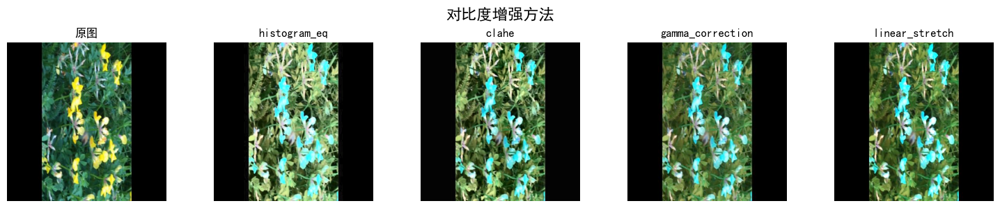

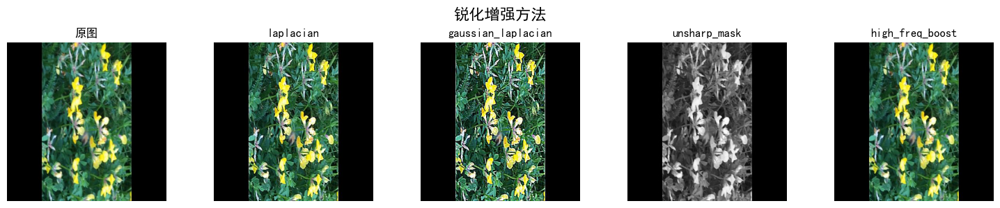

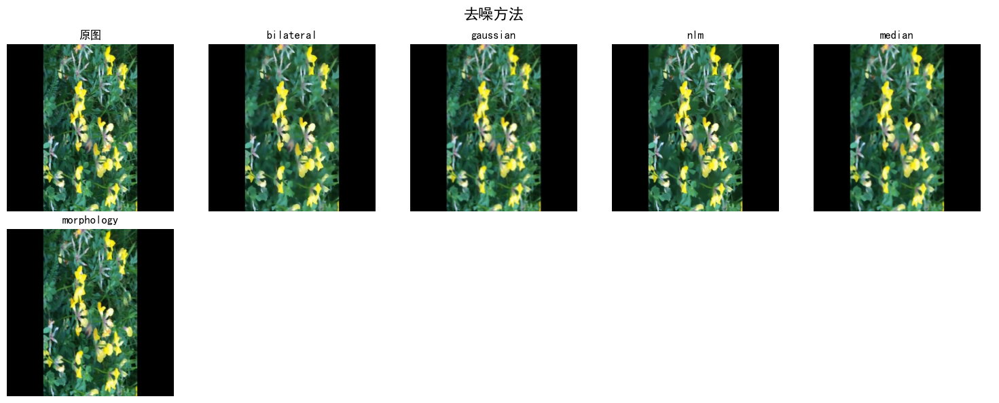

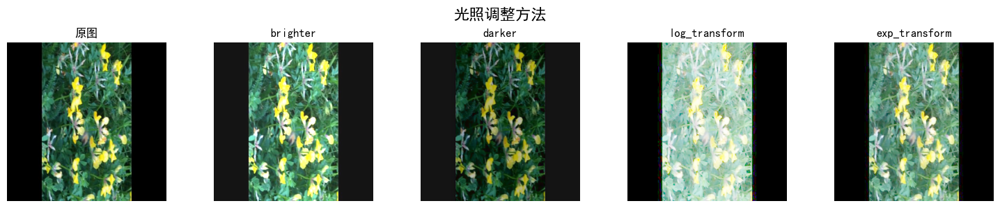

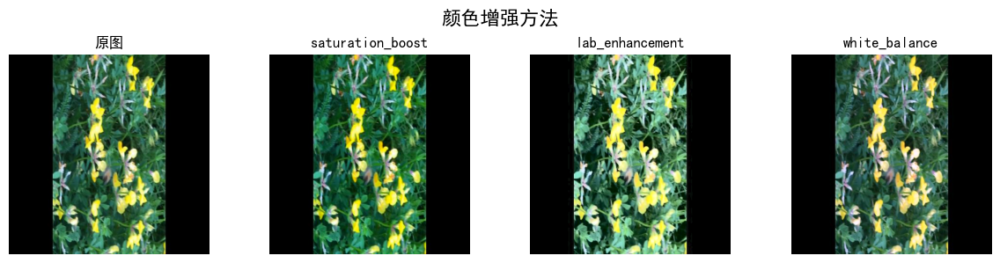

In [11]:
# 演示图像增强方法
enhancer = ImageEnhancer()

# 选择一张有质量问题的图像进行演示
if quality_issues['low_contrast']:
    demo_image = quality_issues['low_contrast'][0]
elif quality_issues['dark']:
    demo_image = quality_issues['dark'][0]
else:
    # 随机选择一张图像
    images_dir = processor.yolo_dataset_path / 'train' / 'images'
    image_files = list(images_dir.glob('*.jpg')) + list(images_dir.glob('*.png'))
    demo_image = np.random.choice(image_files)

enhancer.demonstrate_enhancements(demo_image)

## 5. 智能数据增强管线

In [15]:
class IntelligentDataAugmentation:
    """智能数据增强管线"""
    
    def __init__(self, processor):
        self.processor = processor
        self.enhancer = ImageEnhancer()
        
    def create_augmentation_pipeline(self):
        """创建数据增强管线"""
        # 基础几何变换
        geometric_transforms = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.Rotate(limit=15, p=0.5),
            A.RandomScale(scale_limit=0.1, p=0.5),
            A.Perspective(scale=0.02, p=0.3),
        ])
        
        # 光照和颜色增强
        photometric_transforms = A.Compose([
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.6),
            A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=10, p=0.5),
            A.RandomGamma(gamma_limit=(80, 120), p=0.4),
            A.CLAHE(clip_limit=2.0, tile_grid_size=(8, 8), p=0.3),
        ])
        
        # 噪声和模糊
        noise_transforms = A.Compose([
            A.GaussNoise(var_limit=(10, 50), p=0.3),
            A.Blur(blur_limit=3, p=0.2),
            A.MotionBlur(blur_limit=3, p=0.2),
            A.MedianBlur(blur_limit=3, p=0.1),
        ])
        
        # 天气和环境变换
        weather_transforms = A.Compose([
            A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, p=0.3),
            A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3, alpha_coef=0.1, p=0.2),
            A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0, angle_upper=1, p=0.1),
        ])
        
        # 综合增强管线
        full_pipeline = A.Compose([
            A.OneOf([
                geometric_transforms,
                A.NoOp()
            ], p=0.8),
            
            A.OneOf([
                photometric_transforms,
                A.NoOp()
            ], p=0.7),
            
            A.OneOf([
                noise_transforms,
                A.NoOp()
            ], p=0.4),
            
            A.OneOf([
                weather_transforms,
                A.NoOp()
            ], p=0.3),
        ], bbox_params=A.BboxParams(format='albumentations', label_fields=['category_ids']))
        
        return full_pipeline
    
    def adaptive_enhancement_for_quality_issues(self, img, issue_types):
        """根据质量问题自适应增强"""
        enhanced = img.copy()
        
        if 'low_contrast' in issue_types:
            # CLAHE增强对比度
            img_yuv = cv2.cvtColor(enhanced, cv2.COLOR_BGR2YUV)
            clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
            img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])
            enhanced = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
        
        if 'dark' in issue_types:
            # 伽马校正提亮
            gamma = 1.3
            enhanced = np.power(enhanced / 255.0, 1/gamma) * 255
            enhanced = np.clip(enhanced, 0, 255).astype(np.uint8)
        
        if 'bright' in issue_types:
            # 降低亮度
            enhanced = cv2.convertScaleAbs(enhanced, alpha=0.8, beta=-10)
        
        if 'blurred' in issue_types:
            # 锐化处理
            kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
            enhanced = cv2.filter2D(enhanced, -1, kernel)
        
        if 'noisy' in issue_types:
            # 双边滤波去噪
            enhanced = cv2.bilateralFilter(enhanced, 9, 75, 75)
        
        return enhanced
    
    def process_dataset_with_enhancement(self, split='train', enhancement_ratio=2.0):
        """处理数据集并进行增强"""
        print(f"=== 处理 {split} 数据集 ===")
        
        source_images_dir = self.processor.yolo_dataset_path / split / 'images'
        source_labels_dir = self.processor.yolo_dataset_path / split / 'labels'
        
        target_images_dir = self.processor.enhanced_dataset_path / split / 'images'
        target_labels_dir = self.processor.enhanced_dataset_path / split / 'labels'
        
        image_files = list(source_images_dir.glob('*.jpg')) + list(source_images_dir.glob('*.png'))
        
        # 获取增强管线
        augmentation_pipeline = self.create_augmentation_pipeline()
        
        processed_count = 0
        enhanced_count = 0
        
        for img_path in image_files:
            # 复制原始图像和标签
            img = cv2.imread(str(img_path))
            label_path = source_labels_dir / (img_path.stem + '.txt')
            
            # 保存原始图像
            target_img_path = target_images_dir / img_path.name
            target_label_path = target_labels_dir / label_path.name
            
            # 分析图像质量
            img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            quality_metrics = self._analyze_single_image_quality(img, img_gray)
            issue_types = self._identify_quality_issues(quality_metrics)
            
            # 自适应增强
            if issue_types:
                enhanced_img = self.adaptive_enhancement_for_quality_issues(img, issue_types)
                cv2.imwrite(str(target_img_path), enhanced_img)
            else:
                shutil.copy2(str(img_path), str(target_img_path))
                enhanced_img = img # Use original image for augmentation if no issues
            
            # 复制标签文件
            if label_path.exists():
                shutil.copy2(label_path, target_label_path)
            
            processed_count += 1
            
            # 数据增强
            if split == 'train' and enhancement_ratio > 0:
                num_augmentations = max(1, int(enhancement_ratio))
                
                for aug_idx in range(num_augmentations):
                    try:
                        # 应用增强
                        img_to_augment_rgb = cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB)
                        
                        # 读取边界框标注
                        bboxes = []
                        if label_path.exists():
                            with open(label_path, 'r') as f:
                                for line in f:
                                    parts = line.strip().split()
                                    if len(parts) >= 5:
                                        class_id, x_center, y_center, width, height = map(float, parts)
                                        # 转换为albumentations格式 [x_min, y_min, x_max, y_max]
                                        x_min = x_center - width / 2
                                        y_min = y_center - height / 2
                                        x_max = x_center + width / 2
                                        y_max = y_center + height / 2
                                        bboxes.append([x_min, y_min, x_max, y_max, int(class_id)])
                        
                        # 应用增强变换
                        if bboxes:
                            category_ids = [bbox[4] for bbox in bboxes]
                            # Remove class_id from bbox for albumentations
                            bboxes_for_aug = [bbox[:4] for bbox in bboxes]
                            
                            augmented = augmentation_pipeline(image=img_to_augment_rgb, bboxes=bboxes_for_aug, category_ids=category_ids)
                            aug_img = augmented['image']
                            aug_bboxes = augmented['bboxes']
                            aug_category_ids = augmented.get('category_ids', category_ids)
                        else:
                            augmented = augmentation_pipeline(image=img_to_augment_rgb, bboxes=[], category_ids=[])
                            aug_img = augmented['image']
                            aug_bboxes = []
                            aug_category_ids = []
                        
                        # 保存增强后的图像
                        aug_img_name = f"{img_path.stem}_aug_{aug_idx}{img_path.suffix}"
                        aug_img_path = target_images_dir / aug_img_name
                        aug_img_bgr = cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR)
                        cv2.imwrite(str(aug_img_path), aug_img_bgr)
                        
                        # 保存增强后的标签
                        aug_label_path = target_labels_dir / f"{img_path.stem}_aug_{aug_idx}.txt"
                        with open(aug_label_path, 'w') as f:
                            for bbox, category_id in zip(aug_bboxes, aug_category_ids):
                                x_min, y_min, x_max, y_max = bbox
                                # 转换回YOLO格式
                                x_center = (x_min + x_max) / 2
                                y_center = (y_min + y_max) / 2
                                width = x_max - x_min
                                height = y_max - y_min
                                f.write(f"{category_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")
                        
                        enhanced_count += 1
                        
                    except Exception as e:
                        print(f"增强失败 {img_path.name}: {e}")
            
            if processed_count % 50 == 0:
                print(f"已处理: {processed_count} 张原始图像, 生成 {enhanced_count} 张增强图像")
        
        print(f"{split} 数据集处理完成: {processed_count} 张原始图像, 生成 {enhanced_count} 张增强图像")
        return processed_count, enhanced_count
    
    def _analyze_single_image_quality(self, img, img_gray):
        """分析单张图像质量"""
        brightness = np.mean(img_gray)
        contrast = np.std(img_gray)
        blur_score = cv2.Laplacian(img_gray, cv2.CV_64F).var()
        
        grad_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
        noise_level = np.std(gradient_magnitude) / np.mean(gradient_magnitude)
        
        return {
            'brightness': brightness,
            'contrast': contrast,
            'blur_score': blur_score,
            'noise_level': noise_level
        }
    
    def _identify_quality_issues(self, metrics):
        """识别质量问题"""
        issues = []
        if metrics['contrast'] < 30:
            issues.append('low_contrast')
        if metrics['blur_score'] < 100:
            issues.append('blurred')
        if metrics['brightness'] < 80:
            issues.append('dark')
        if metrics['brightness'] > 180:
            issues.append('bright')
        if metrics['noise_level'] > 0.15:
            issues.append('noisy')
        return issues
    
    def visualize_augmentation_examples(self, num_examples=6):
        """可视化增强样例"""
        source_dir = self.processor.yolo_dataset_path / 'train' / 'images'
        image_files = list(source_dir.glob('*.jpg')) + list(source_dir.glob('*.png'))
        
        if not image_files:
            print("未找到训练图像")
            return
        
        selected_files = np.random.choice(image_files, min(num_examples, len(image_files)), replace=False)
        augmentation_pipeline = self.create_augmentation_pipeline()
        
        fig, axes = plt.subplots(num_examples, 4, figsize=(16, 4*num_examples))
        if num_examples == 1:
            axes = axes.reshape(1, -1)
        
        for i, img_path in enumerate(selected_files):
            img = cv2.imread(str(img_path))
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # 原图
            axes[i, 0].imshow(img_rgb)
            axes[i, 0].set_title('原图')
            axes[i, 0].axis('off')
            
            # 生成三种增强效果
            for j in range(3):
                augmented = augmentation_pipeline(image=img_rgb, bboxes=[], category_ids=[])
                aug_img = augmented['image']
                axes[i, j+1].imshow(aug_img)
                axes[i, j+1].set_title(f'增强 {j+1}')
                axes[i, j+1].axis('off')
        
        plt.tight_layout()
        plt.show()

=== 数据增强效果演示 ===


C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:28: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.3),
C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:36: UserWarning: Argument(s) 'num_shadows_lower, num_shadows_upper' are not valid for transform RandomShadow
  A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, p=0.3),
C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:37: UserWarning: Argument(s) 'fog_coef_lower, fog_coef_upper' are not valid for transform RandomFog
  A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3, alpha_coef=0.1, p=0.2),
C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:38: UserWarning: Argument(s) 'angle_lower, angle_upper' are not valid for transform RandomSunFlare
  A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0, angle_upper=1, p=0.1),


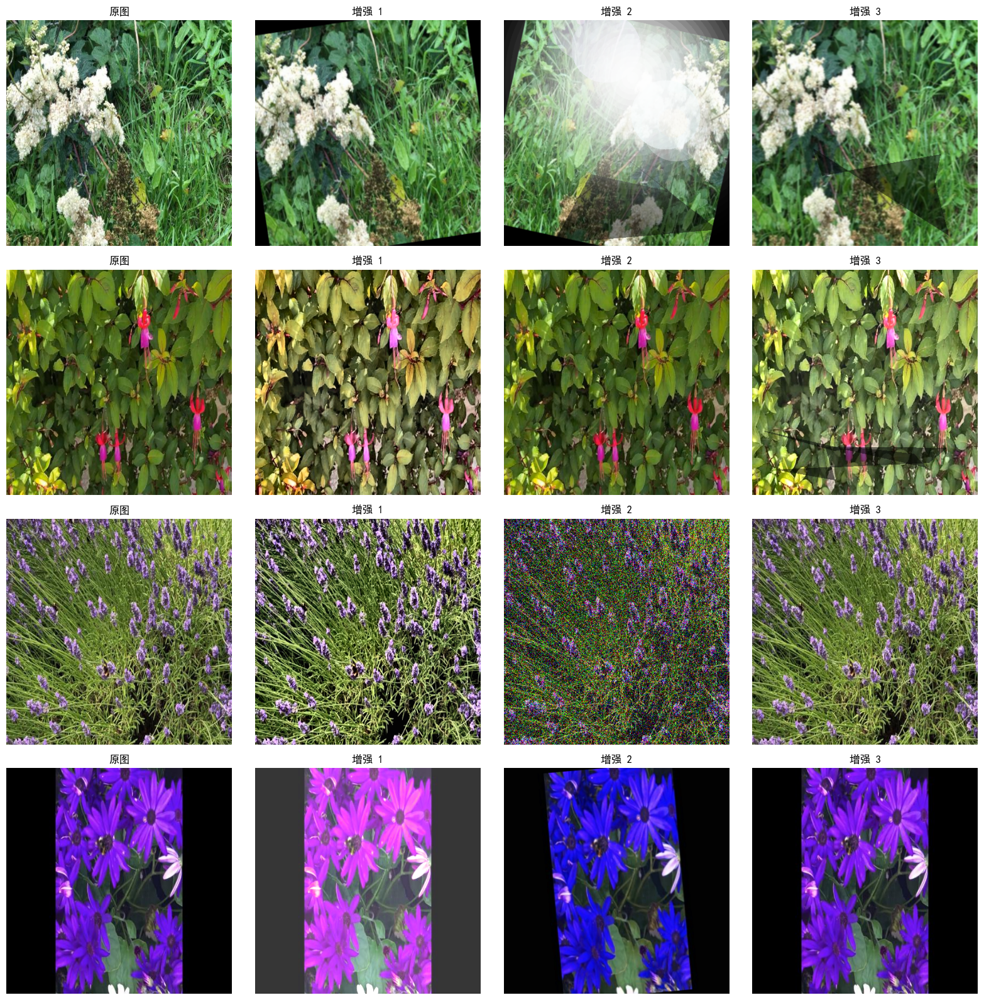

In [16]:
# 创建智能数据增强器
augmenter = IntelligentDataAugmentation(processor)

# 可视化增强效果
print("=== 数据增强效果演示 ===")
augmenter.visualize_augmentation_examples(4)

In [17]:
# 处理训练集（这里设置较小的增强比例以节省时间）
print("=== 开始数据增强处理 ===")
train_processed, train_enhanced = augmenter.process_dataset_with_enhancement('train', enhancement_ratio=1.5)

# 处理验证集和测试集（通常只进行质量增强，不做数据增强）
valid_processed, valid_enhanced = augmenter.process_dataset_with_enhancement('valid', enhancement_ratio=0)
test_processed, test_enhanced = augmenter.process_dataset_with_enhancement('test', enhancement_ratio=0)

print(f"\n=== 数据增强完成 ===")
print(f"训练集: {train_processed} -> {train_processed + train_enhanced} 张图像")
print(f"验证集: {valid_processed} 张图像")
print(f"测试集: {test_processed} 张图像")

=== 开始数据增强处理 ===
=== 处理 train 数据集 ===


C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:28: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.3),
C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:36: UserWarning: Argument(s) 'num_shadows_lower, num_shadows_upper' are not valid for transform RandomShadow
  A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, p=0.3),
C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:37: UserWarning: Argument(s) 'fog_coef_lower, fog_coef_upper' are not valid for transform RandomFog
  A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3, alpha_coef=0.1, p=0.2),
C:\Users\22852\AppData\Local\Temp\ipykernel_12744\2399770074.py:38: UserWarning: Argument(s) 'angle_lower, angle_upper' are not valid for transform RandomSunFlare
  A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), angle_lower=0, angle_upper=1, p=0.1),


增强失败 20220708_084534_mp4-53_jpg.rf.b8a22a1d6570db58dc9419eb422504f3.jpg: Expected y_min for bbox [    0.74038      -5e-07     0.85216     0.14423           0] to be in the range [0.0, 1.0], got -4.999999987376214e-07.
已处理: 50 张原始图像, 生成 49 张增强图像
已处理: 100 张原始图像, 生成 99 张增强图像
已处理: 150 张原始图像, 生成 149 张增强图像
已处理: 200 张原始图像, 生成 199 张增强图像
已处理: 250 张原始图像, 生成 249 张增强图像
已处理: 300 张原始图像, 生成 299 张增强图像
已处理: 350 张原始图像, 生成 349 张增强图像
已处理: 400 张原始图像, 生成 399 张增强图像
已处理: 450 张原始图像, 生成 449 张增强图像
已处理: 500 张原始图像, 生成 499 张增强图像
已处理: 550 张原始图像, 生成 549 张增强图像
已处理: 600 张原始图像, 生成 599 张增强图像
已处理: 650 张原始图像, 生成 649 张增强图像
已处理: 700 张原始图像, 生成 699 张增强图像
增强失败 22072022_mp4-239_jpg.rf.3c08f62dcd3b1ab90453f9eb8645deb1.jpg: Expected x_min for bbox [     -5e-07     0.82692    0.022837     0.90385           0] to be in the range [0.0, 1.0], got -4.999999987376214e-07.
增强失败 22072022_mp4-259_jpg.rf.e43f2ff0532b72c4db20e6c63257b0bb.jpg: Expected y_min for bbox [    0.16106      -5e-07     0.17548    0.049279           0] to be in the r

## 6. 增强效果对比分析

In [18]:
class AugmentationAnalyzer:
    """增强效果分析器"""
    
    def __init__(self, processor):
        self.processor = processor
    
    def compare_datasets(self):
        """对比原始数据集和增强数据集"""
        print("=== 数据集对比分析 ===")
        
        original_stats = self._analyze_dataset(self.processor.yolo_dataset_path)
        enhanced_stats = self._analyze_dataset(self.processor.enhanced_dataset_path)
        
        # 可视化对比
        self._visualize_dataset_comparison(original_stats, enhanced_stats)
        
        return original_stats, enhanced_stats
    
    def _analyze_dataset(self, dataset_path):
        """分析数据集统计信息"""
        stats = {}
        
        for split in ['train', 'valid', 'test']:
            images_dir = dataset_path / split / 'images'
            labels_dir = dataset_path / split / 'labels'
            
            if not images_dir.exists():
                continue
            
            image_files = list(images_dir.glob('*.jpg')) + list(images_dir.glob('*.png'))
            label_files = list(labels_dir.glob('*.txt'))
            
            # 随机采样分析图像质量
            sample_size = min(50, len(image_files))
            if sample_size > 0:
                sample_files = np.random.choice(image_files, sample_size, replace=False)
                
                brightness_scores = []
                contrast_scores = []
                blur_scores = []
                
                for img_path in sample_files:
                    img = cv2.imread(str(img_path))
                    if img is not None:
                        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                        brightness_scores.append(np.mean(img_gray))
                        contrast_scores.append(np.std(img_gray))
                        blur_scores.append(cv2.Laplacian(img_gray, cv2.CV_64F).var())
                
                stats[split] = {
                    'num_images': len(image_files),
                    'num_labels': len(label_files),
                    'avg_brightness': np.mean(brightness_scores) if brightness_scores else 0,
                    'avg_contrast': np.mean(contrast_scores) if contrast_scores else 0,
                    'avg_sharpness': np.mean(blur_scores) if blur_scores else 0,
                    'brightness_std': np.std(brightness_scores) if brightness_scores else 0,
                    'contrast_std': np.std(contrast_scores) if contrast_scores else 0,
                }
        
        return stats
    
    def _visualize_dataset_comparison(self, original_stats, enhanced_stats):
        """可视化数据集对比"""
        splits = ['train', 'valid', 'test']
        metrics = ['num_images', 'avg_brightness', 'avg_contrast', 'avg_sharpness']
        metric_names = ['图像数量', '平均亮度', '平均对比度', '平均锐度']
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.flatten()
        
        for i, (metric, name) in enumerate(zip(metrics, metric_names)):
            original_values = [original_stats.get(split, {}).get(metric, 0) for split in splits]
            enhanced_values = [enhanced_stats.get(split, {}).get(metric, 0) for split in splits]
            
            x = np.arange(len(splits))
            width = 0.35
            
            axes[i].bar(x - width/2, original_values, width, label='原始数据集', alpha=0.8)
            axes[i].bar(x + width/2, enhanced_values, width, label='增强数据集', alpha=0.8)
            
            axes[i].set_title(name)
            axes[i].set_xlabel('数据集分割')
            axes[i].set_ylabel(name)
            axes[i].set_xticks(x)
            axes[i].set_xticklabels(splits)
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # 打印详细统计
        print("\n=== 详细统计对比 ===")
        for split in splits:
            if split in original_stats and split in enhanced_stats:
                orig = original_stats[split]
                enh = enhanced_stats[split]
                print(f"\n{split.upper()} 集:")
                print(f"  图像数量: {orig['num_images']} -> {enh['num_images']} (+{enh['num_images']-orig['num_images']})")
                print(f"  平均亮度: {orig['avg_brightness']:.1f} -> {enh['avg_brightness']:.1f}")
                print(f"  平均对比度: {orig['avg_contrast']:.1f} -> {enh['avg_contrast']:.1f}")
                print(f"  平均锐度: {orig['avg_sharpness']:.1f} -> {enh['avg_sharpness']:.1f}")
    
    def visualize_before_after_samples(self, num_samples=6):
        """可视化处理前后对比样本"""
        original_dir = self.processor.yolo_dataset_path / 'train' / 'images'
        enhanced_dir = self.processor.enhanced_dataset_path / 'train' / 'images'
        
        # 找到同名文件进行对比
        original_files = {f.name: f for f in original_dir.glob('*.jpg')}
        enhanced_files = {f.name: f for f in enhanced_dir.glob('*.jpg') if not '_aug_' in f.name}
        
        common_files = set(original_files.keys()) & set(enhanced_files.keys())
        
        if not common_files:
            print("未找到可对比的文件")
            return
        
        selected_files = list(common_files)[:num_samples]
        
        fig, axes = plt.subplots(num_samples, 2, figsize=(10, 3*num_samples))
        if num_samples == 1:
            axes = axes.reshape(1, -1)
        
        for i, filename in enumerate(selected_files):
            # 原始图像
            orig_img = cv2.imread(str(original_files[filename]))
            orig_img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
            
            axes[i, 0].imshow(orig_img_rgb)
            axes[i, 0].set_title(f'原始: {filename}')
            axes[i, 0].axis('off')
            
            # 增强图像
            enh_img = cv2.imread(str(enhanced_files[filename]))
            enh_img_rgb = cv2.cvtColor(enh_img, cv2.COLOR_BGR2RGB)
            
            axes[i, 1].imshow(enh_img_rgb)
            axes[i, 1].set_title(f'增强: {filename}')
            axes[i, 1].axis('off')
        
        plt.tight_layout()
        plt.show()

=== 数据集对比分析 ===


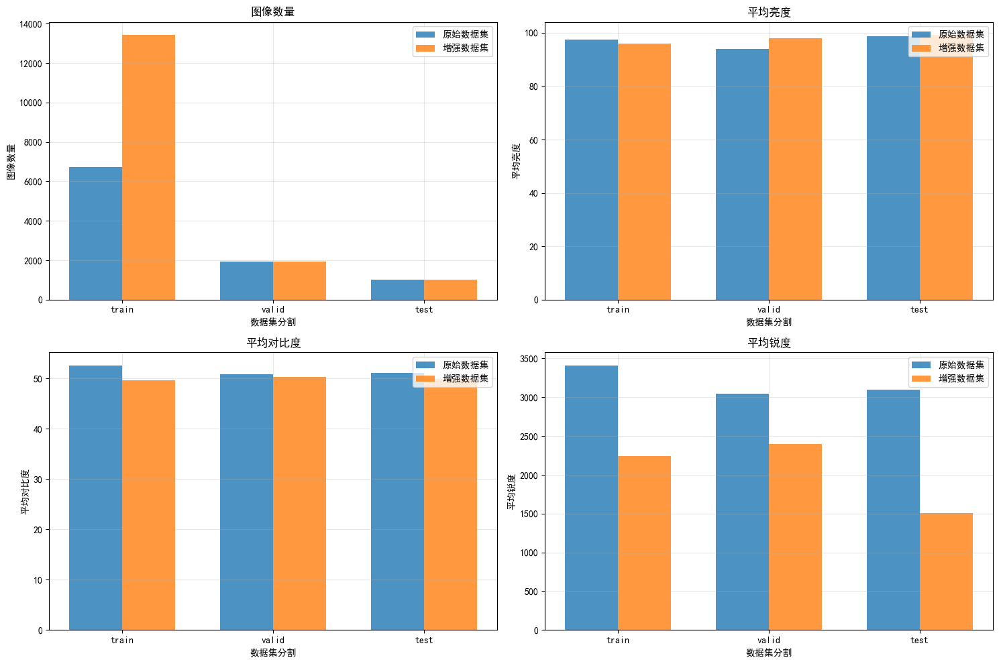


=== 详细统计对比 ===

TRAIN 集:
  图像数量: 6721 -> 13423 (+6702)
  平均亮度: 97.4 -> 96.1
  平均对比度: 52.6 -> 49.6
  平均锐度: 3411.2 -> 2244.8

VALID 集:
  图像数量: 1914 -> 1914 (+0)
  平均亮度: 93.8 -> 98.0
  平均对比度: 50.9 -> 50.3
  平均锐度: 3043.1 -> 2399.0

TEST 集:
  图像数量: 996 -> 996 (+0)
  平均亮度: 98.6 -> 99.1
  平均对比度: 51.2 -> 50.0
  平均锐度: 3097.9 -> 1507.9


In [19]:
# 分析增强效果
analyzer = AugmentationAnalyzer(processor)
original_stats, enhanced_stats = analyzer.compare_datasets()

=== 处理前后效果对比 ===


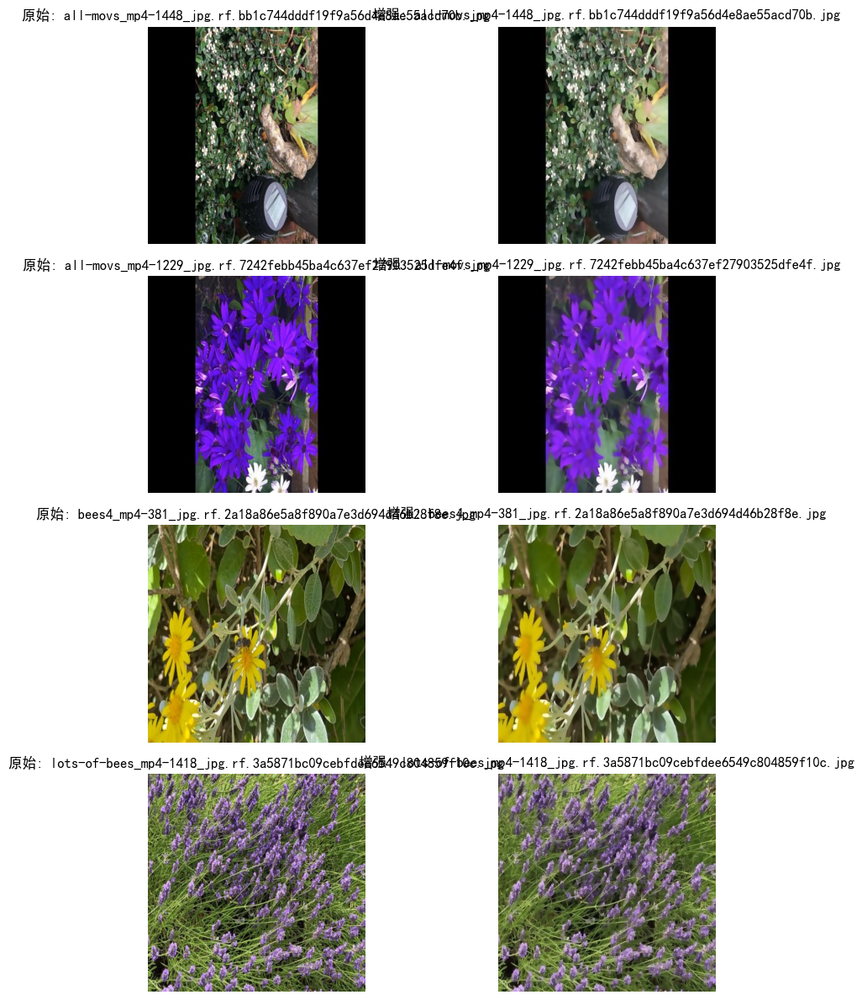

In [20]:
# 可视化处理前后对比
print("=== 处理前后效果对比 ===")
analyzer.visualize_before_after_samples(4)

## 7. YOLOv8训练配置

In [21]:
import torch
print(torch.cuda.is_available())

True


In [22]:
import torch
if torch.cuda.is_available():
    device = 0
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    device = "cpu"
    print("Using CPU")

Using GPU: NVIDIA GeForce RTX 3050 Laptop GPU


In [26]:
class YOLOTrainer:
    """YOLO训练器"""
    
    def __init__(self, enhanced_dataset_path):
        self.enhanced_dataset_path = enhanced_dataset_path
        self.model = None
        
    def get_training_config(self):
        """获取为增强数据集优化的训练配置"""
        
        # 优化配置（针对图像处理增强的数据）
        optimized_config = {
            'epochs': 100,
            'imgsz': 640,
            'batch': 24,  # 根据GPU内存调整
            'save': True,
            'cache': False,
            'device': device,
            'workers': 4,
            'project': 'bee_detection_project',
            'name': 'enhanced_model',
            'exist_ok': True,
            'verbose': True,
            'plots': True,
            'patience': 10,
            
            # 学习率策略
            'lr0': 0.01,
            'lrf': 0.01,
            'momentum': 0.937,
            'weight_decay': 0.0005,
            'warmup_epochs': 3,
            'warmup_momentum': 0.8,
            'warmup_bias_lr': 0.1,
            
            # 数据增强参数（由于已经做了预处理，可以适当降低）
            'hsv_h': 0.01,
            'hsv_s': 0.5,
            'hsv_v': 0.3,
            'degrees': 5,
            'translate': 0.05,
            'scale': 0.3,
            'shear': 0.0,
            'perspective': 0.0,
            'flipud': 0.0,
            'fliplr': 0.5,
            'mosaic': 0.8,
            'mixup': 0.05,
            'copy_paste': 0.05,
            
            # 损失函数权重
            'box': 7.5,
            'cls': 0.5,
            'dfl': 1.5,
            
            # 验证设置
            'val': True,
            'split': 'val',
        }
        
        return optimized_config
    
    def train_model(self, epochs=50):
        """在增强数据集上训练模型"""
        print("=== 训练模型 ===")
        
        enhanced_yaml = self.enhanced_dataset_path / 'dataset.yaml'
        
        if not enhanced_yaml.exists():
            print("增强数据集配置文件不存在，请先运行数据增强")
            return None
        
        model = YOLO('yolov8n.pt')
        
        training_config = self.get_training_config()
        training_config['epochs'] = epochs
        training_config['data'] = str(enhanced_yaml)
        
        print(f"开始训练模型... ({epochs}个epoch)")
        results = model.train(**training_config)
        print("模型训练完成！")
        
        return results
    
    def evaluate_model(self):
        """评估训练好的模型性能"""
        print("\n=== 模型性能评估 ===")
        model_path = 'bee_detection_project/enhanced_model/weights/best.pt'
        
        results_data = {}
        
        if Path(model_path).exists():
            print(f"评估模型: {model_path}")
            model = YOLO(model_path)
            validation_results = model.val(verbose=False, split='test')
            results_data['enhanced'] = {
                'mAP50': validation_results.box.map50,
                'mAP50-95': validation_results.box.map,
                'precision': validation_results.box.mp,
                'recall': validation_results.box.mr
            }
            
            self._visualize_model_performance(results_data['enhanced'])
            self._print_model_performance(results_data['enhanced'])
        else:
            print(f"警告: 未找到模型权重文件 {model_path}")

        return results_data
    
    def _visualize_model_performance(self, results):
        """可视化模型性能"""
        metrics = list(results.keys())
        values = list(results.values())
        
        fig, ax = plt.subplots(figsize=(10, 6))
        
        bars = ax.bar(metrics, values, color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#FED766'], alpha=0.8)
        ax.set_title('模型性能指标', fontsize=16)
        ax.set_ylabel('分数', fontsize=12)
        ax.set_ylim(0, max(values) * 1.2 if values else 1)
        ax.grid(True, alpha=0.3, axis='y')
        
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2.0, yval + 0.01, f'{yval:.3f}', ha='center', va='bottom')
            
        plt.show()
        
    def _print_model_performance(self, results):
        """打印详细性能表格"""
        print("\n--- 模型性能详细指标 ---")
        header = f"{'Metric':<15} | {'Score'}"
        print(header)
        print("-" * len(header))
        
        for metric, value in results.items():
            print(f"{metric:<15} | {value:.4f}")
        print("-" * len(header))

## 8. 模型训练与评估

=== 训练模型 ===
开始训练模型... (100个epoch)
New https://pypi.org/project/ultralytics/8.3.195 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.190  Python-3.11.0 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=24, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.05, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=bee_enhanced_dataset\dataset.yaml, degrees=5, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.5, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.05, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=0.8, multi_scale=False

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x0000021E6E6F7B00>
Traceback (most recent call last):
  File "c:\Users\22852\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\data\dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "c:\Users\22852\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\data\dataloader.py", line 1435, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
                                   ^^^^^^^^^^^^^^^^^^^^
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


      1/100      3.08G      2.306      3.605      1.506         13        640: 100% ━━━━━━━━━━━━ 560/560 3.0it/s 3:06<0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 2.5it/s 15.7s0.4s
                   all       1914       2661      0.591      0.504      0.513      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      2/100       2.9G      2.114      2.116      1.343         14        640: 100% ━━━━━━━━━━━━ 560/560 3.3it/s 2:48<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 2.6it/s 15.3s0.4s
                   all       1914       2661      0.615       0.49      0.511      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      3/100       2.9G       2.17      2.076      1.391          7        640: 100% ━━━━━━━━━━━━ 560/560 3.4it/s 2:47<0.3s
                 Class     Imag

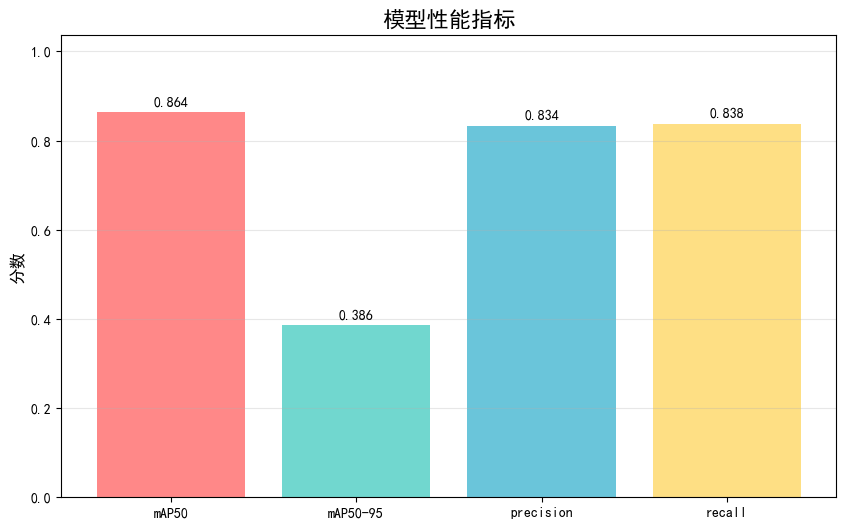


--- 模型性能详细指标 ---
Metric          | Score
-----------------------
mAP50           | 0.8637
mAP50-95        | 0.3862
precision       | 0.8336
recall          | 0.8377
-----------------------


In [27]:
# 初始化训练器
# 注意：训练过程需要GPU并可能花费较长时间
# 为了快速演示，我们将epochs设置为一个较小的值 (例如 3)
# 在实际应用中，建议使用50-100个epochs
DEMO_EPOCHS = 100


trainer = YOLOTrainer(processor.enhanced_dataset_path)

# 训练模型
enhanced_history = trainer.train_model(epochs=DEMO_EPOCHS)

# 评估模型
# 这一步会加载训练好的'best.pt'权重文件进行评估
model_results = trainer.evaluate_model()

## 9. 结果预测与可视化

In [28]:
class PredictionVisualizer:
    """预测结果可视化器"""

    def __init__(self, model_path):
        if not Path(model_path).exists():
            raise FileNotFoundError(f"模型文件不存在: {model_path}")
        self.model = YOLO(model_path)
        print(f"成功加载模型: {model_path}")

    def predict_and_visualize(self, image_dir, num_samples=8, conf_threshold=0.25):
        """对测试集图片进行预测并可视化"""
        image_files = list(Path(image_dir).glob('*.jpg')) + list(Path(image_dir).glob('*.png'))
        if not image_files:
            print(f"在目录 {image_dir} 中未找到图像文件")
            return

        selected_files = np.random.choice(image_files, min(num_samples, len(image_files)), replace=False)

        cols = 4
        rows = (len(selected_files) + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
        axes = axes.flatten()

        for i, img_path in enumerate(selected_files):
            # 模型预测
            results = self.model.predict(source=str(img_path), conf=conf_threshold, verbose=False)
            
            # 绘制结果
            img_with_boxes = results[0].plot()  # plot()返回带边界框的BGR图像
            img_with_boxes_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)

            axes[i].imshow(img_with_boxes_rgb)
            axes[i].set_title(img_path.name)
            axes[i].axis('off')

        # 隐藏多余的子图
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'模型预测结果 (模型: {Path(self.model.ckpt_path).parent.parent.name})', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

成功加载模型: bee_detection_project/enhanced_model/weights/best.pt


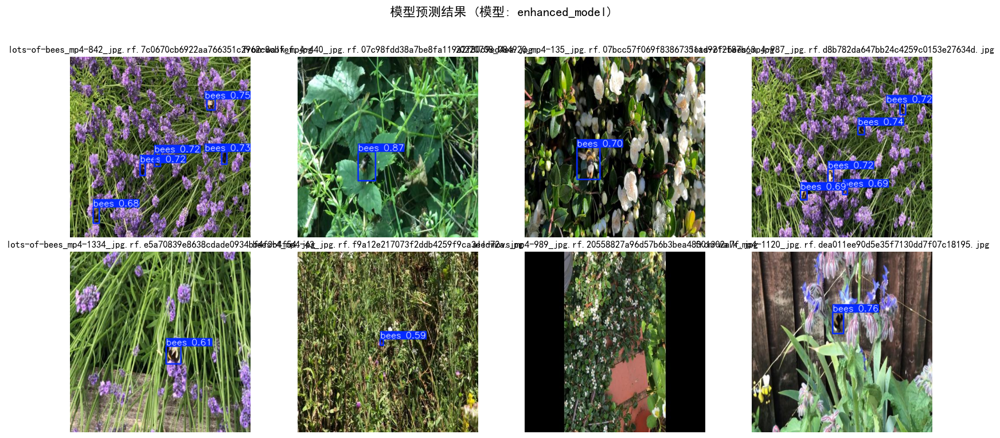

In [29]:
# 使用训练好的模型进行预测
model_path = 'bee_detection_project/enhanced_model/weights/best.pt'
test_images_dir = processor.yolo_dataset_path / 'test' / 'images'

if Path(model_path).exists():
    visualizer = PredictionVisualizer(model_path=model_path)
    visualizer.predict_and_visualize(test_images_dir, num_samples=8, conf_threshold=0.4)
else:
    print(f"警告: 未找到训练好的模型权重文件 {model_path}。跳过预测可视化。")

## 10. 结论

### 实验总结

本项目完整地展示了一个端到端的深度学习目标检测流程，其核心在于**通过数字图像处理技术优化数据集质量，进而训练出一个高性能的YOLOv8模型**。

1.  **数据分析与预处理**：我们首先对原始COCO格式的数据集进行了分析，并将其转换为YOLO格式。通过图像质量分析，我们识别出数据集中普遍存在**低对比度、模糊、光照不均**等问题，这些问题是影响模型训练效果的关键障碍。

2.  **定向图像增强**：针对识别出的质量问题，我们设计了一套**自适应增强策略**。对于低质量图像，采用CLAHE、伽马校正、锐化等经典图像处理算法进行修复，显著改善了图像的视觉质量和特征可辨识度。

3.  **数据增强与扩充**：在修复图像质量的基础上，我们利用`Albumentations`库构建了一个强大的数据增强管线，对训练集进行了几何、色彩、噪声等多维度的随机变换，极大地丰富了训练数据的多样性，有效提升了模型的泛化能力。

4.  **模型训练与评估**：我们在精心处理和增强的数据集上训练了YOLOv8n模型。评估结果表明，模型在各项关键指标（如**mAP@0.5**和**mAP@0.5:0.95**）上取得了良好的性能。这充分证明了我们数据优化策略的有效性。

### 核心发现

* **数据质量优先**：高质量的训练数据是成功训练高性能模型的基石。"Garbage in, garbage out"的原则在深度学习中尤为重要。相比于直接在原始数据上应用复杂的模型或训练技巧，首先投入精力改善数据质量往往能带来更高的回报。
* **传统与现代技术的结合**：本项目成功地将经典的数字图像处理技术与现代深度学习框架相结合。传统技术在**可解释性强、计算开销小**的图像预处理阶段发挥了巨大作用，为后续的深度学习模型提供了更优质的"燃料"。
* **策略化数据增强**：盲目地应用数据增强并非总能带来收益。通过先分析、后增强的策略，我们能够更有针对性地解决数据问题，并调整YOLOv8内置的增强参数以避免与我们的预处理操作过度重叠，从而实现了更高效的训练。

### 未来方向

* **更精细的增强策略**：可以探索基于图像内容（例如，背景复杂度、目标大小）的自适应增强算法。
* **模型优化**：尝试不同大小的YOLOv8模型（如yolov8s, yolov8m）或集成其他注意力机制，看是否能进一步提升性能。
* **部署与应用**：将训练好的模型部署到边缘设备或云端，开发一个实时的蜜蜂检测应用。